In [ ]:
!pip install aerosandbox

import os
import sys

import numpy as np

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, ReLU, Conv2DTranspose, Conv2D, Reshape, Dropout, Flatten
import random

# Set random seeds for reproducibility
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

from aerosandbox import Airfoil, KulfanAirfoil

import pandas as pd

import plotly.express as px
import plotly.graph_objects as go

!mkdir images
!mkdir models

mkdir: cannot create directory ‘images’: File exists
mkdir: cannot create directory ‘models’: File exists


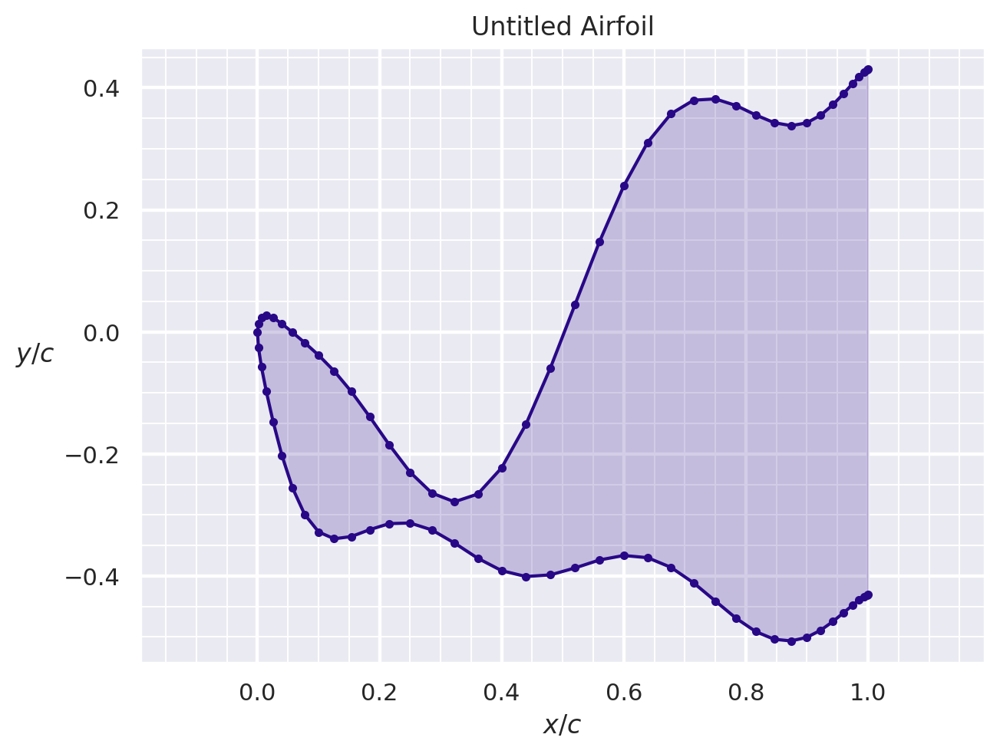

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer
import numpy as np


class CSTLayer(Layer):
    def __init__(self, n_points_per_side = 75, **kwargs):
        super(CSTLayer, self).__init__(**kwargs)
        self.N1 = 0.5
        self.N2 = 1
        self.n_points_per_side = n_points_per_side

    def call(self, inputs, parameters):
        """
        Args:
            inputs: A 3D tensor of shape (batch_size, 2, num_weights).
                   Represents the CST weights for the upper and lower surfaces.
            parameters: A 2D tensor of shape (batch_size, 2).
                       Represents batch-specific parameters:
                       - parameters[:, 0]: TE_thickness for each sample in the batch.
                       - parameters[:, 1]: leading_edge_weight for each sample in the batch.
        """

        # Inputs is a 3D tensor: (batch_size, 2, num_weights)
        # For example, shape: (batch_size, 2, 12)
        batch_size = tf.shape(inputs)[0]
        num_weights = tf.shape(inputs)[2]

        # Split into lower and upper weights
        lower_weights = inputs[:, 0, :]  # Shape: (batch_size, num_weights)
        upper_weights = inputs[:, 1, :]  # Shape: (batch_size, num_weights)

        # Extract batch-specific parameters
        leading_edge_weight = parameters[:, 0]  # Shape: (batch_size,)
        TE_thickness = parameters[:, 1]  # Shape: (batch_size,)

        # Generate cosinically spaced points
        x = (
            1 - tf.cos(tf.linspace(0.0, np.pi, self.n_points_per_side))
        ) / 2  # Shape: (n_points_per_side,)

        # Class function
        C = (x**self.N1) * ((1 - x) ** self.N2)  # Shape: (n_points_per_side,)

        def shape_function(w):
            # Shape function (Bernstein polynomials)
            N = tf.cast(tf.shape(w)[1] - 1, dtype=tf.float32)  # num_weights - 1

            # Compute binomial coefficients using TensorFlow
            k = tf.range(N + 1, dtype=tf.float32)  # Shape: (num_weights,)
            log_comb = tf.math.lgamma(N + 1) - tf.math.lgamma(k + 1) - tf.math.lgamma(N - k + 1)
            K = tf.exp(log_comb)  # Shape: (num_weights,)

            # Expand dimensions for broadcasting
            K = tf.expand_dims(K, axis=-1)  # Shape: (num_weights, 1)
            x_expanded = tf.expand_dims(x, axis=0)  # Shape: (1, n_points_per_side)
            arange = tf.expand_dims(k, axis=-1)  # Shape: (num_weights, 1)

            # Compute Bernstein polynomials
            S_matrix = (
                K * (x_expanded**arange) * ((1 - x_expanded) ** (N - arange))
            )  # Shape: (num_weights, n_points_per_side)

            # Multiply by weights and sum over the Bernstein polynomials
            w_expanded = tf.expand_dims(w, axis=-1)  # Shape: (batch_size, num_weights, 1)
            S_x = tf.reduce_sum(w_expanded * S_matrix, axis=1)  # Shape: (batch_size, n_points_per_side)

            # Calculate the output y
            y = C * S_x  # Shape: (batch_size, n_points_per_side)
            return y

        # Apply shape function to lower and upper weights
        y_lower = shape_function(lower_weights)  # Shape: (batch_size, n_points_per_side)
        y_upper = shape_function(upper_weights)  # Shape: (batch_size, n_points_per_side)

        # Trailing edge thickness (TE thickness)
        # Reshape TE_thickness for broadcasting: (batch_size, 1)
        TE_thickness = tf.expand_dims(TE_thickness, axis=-1)  # Shape: (batch_size, 1)
        y_lower -= x * TE_thickness / 2  # Shape: (batch_size, n_points_per_side)
        y_upper += x * TE_thickness / 2  # Shape: (batch_size, n_points_per_side)

        # Leading edge modification (LEM)
        # Reshape leading_edge_weight for broadcasting: (batch_size, 1)
        leading_edge_weight = tf.expand_dims(leading_edge_weight, axis=-1)  # Shape: (batch_size, 1)
        y_lower += (
            leading_edge_weight
            * x
            * (1 - x) ** (tf.cast(num_weights, dtype=tf.float32) + 0.5)
        )
        y_upper += (
            leading_edge_weight
            * x
            * (1 - x) ** (tf.cast(num_weights, dtype=tf.float32) + 0.5)
        )

        # Create airfoil coordinates
        x = tf.tile(tf.expand_dims(x, axis=0), [batch_size, 1])  # Shape: (batch_size, n_points_per_side)
        x = tf.concat([x[:, ::-1], x[:, 1:]], axis=1)  # Shape: (batch_size, 2 * n_points_per_side - 1)
        y = tf.concat([y_upper[:, ::-1], y_lower[:, 1:]], axis=1)  # Shape: (batch_size, 2 * n_points_per_side - 1)

        # Stack x and y coordinates
        coordinates = tf.stack([x, y], axis=-1)  # Shape: (batch_size, 2 * n_points_per_side - 1, 2)
        return coordinates

# Create an instance of the CSTLayer
cst_layer = CSTLayer(n_points_per_side = 40)

# Create dummy input data
batch_size = 3
num_weights = 12  # Number of CST weights for each surface (upper and lower)
dummy_input = tf.random.normal([batch_size, 2, num_weights])  # Shape: (batch_size, 2, num_weights)
dummy_parameters = tf.random.normal([batch_size, 2])

# Pass the input through the CSTLayer
coordinates = cst_layer(dummy_input, dummy_parameters)  # Shape: (batch_size, 2 * n_points_per_side - 1, 2)

test = Airfoil(coordinates=coordinates[0])
test.draw()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Output shape:  (3, 2, 12)
Coordinates shape:  (3, 79, 2)
tf.Tensor(
[[0.8890574  0.        ]
 [0.50373733 0.42928973]
 [0.         0.98769265]], shape=(3, 2), dtype=float32)


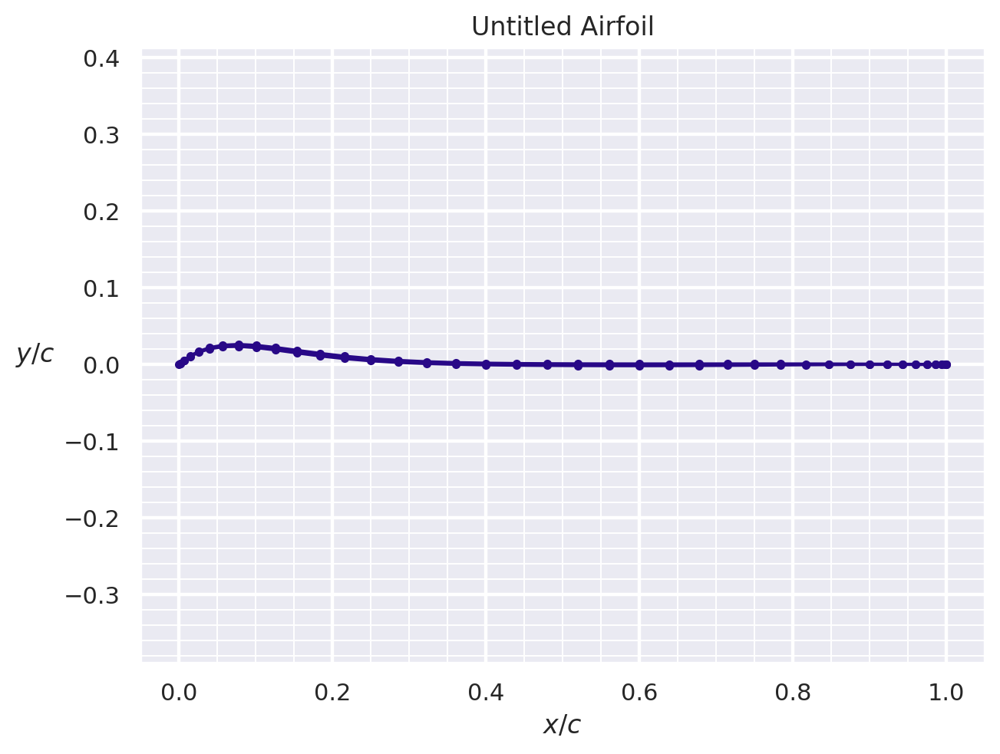

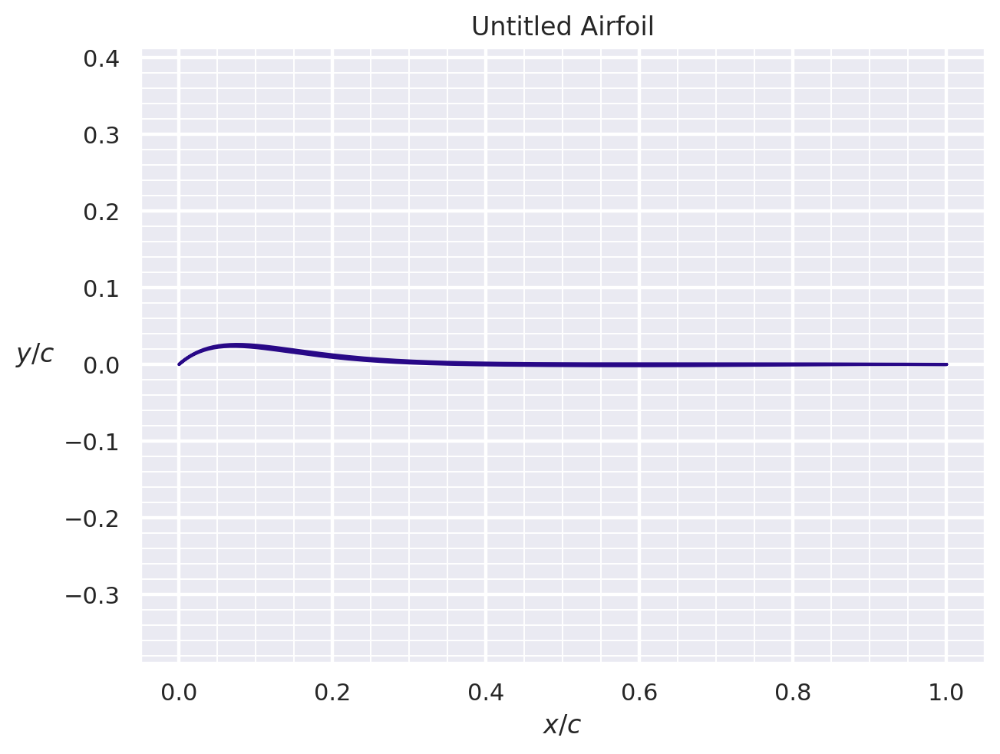

In [ ]:
class CSTGenerator(tf.keras.Model):
    '''
    * Refs:
        - Lin, Jinxing & Zhang, Chenliang & Xie, Xiaoye & Shi, Xingyu & Xu, Xiaoyu & Duan, Yanhui. (2022). CST-GANs: A Generative Adversarial Network Based on CST Parameterization for the Generation of Smooth Airfoils. 600-605. 10.1109/ICUS55513.2022.9987080.
    '''
    def __init__(self, npv: int = 12, latent_dim: int = 128, kernel_size: tuple = (2,4), depth: int = 256, n_points_per_side = 75, use_modifications = True):
        super().__init__()

        # --- Parameters ---

        '''
        * npv: Number of parameterized variables
        * latent_dim: Dimension of input vector (latent vector)
        * depth: Number of channels after first dense layer
        '''

        self.npv = npv
        self.latent_dim = latent_dim
        self.kernel_size = kernel_size
        self.depth = depth
        self.use_modifications = use_modifications
        self.n_points_per_side = n_points_per_side

        # --- Layers ---

        # Fully connected layers
        # CST Weights
        self.dense1 = Dense(self.depth * 2 * self.npv)
        self.batch1 = BatchNormalization(momentum=0.9)
        self.leaky_relu1 = LeakyReLU(0.2)

        self.reshape = Reshape((2, self.npv, self.depth))

        # LEM and TET
        self.dense2 = Dense(self.depth, input_shape=(self.latent_dim,))
        self.batch7 = BatchNormalization(momentum=0.9)
        self.leaky_relu7 = LeakyReLU(0.2)

        self.dense3 = Dense(int(self.depth / 4))
        self.batch8 = BatchNormalization(momentum=0.9)
        self.leaky_relu8 = LeakyReLU(0.2)

        self.dense4 = Dense(2)
        self.relu1 = ReLU()

        # Transposed convolutions
        self.deconv1 = Conv2DTranspose(int(self.depth / 2), self.kernel_size, strides=(1,2), padding='same')
        self.batch2 = BatchNormalization(momentum=0.9)
        self.leaky_relu2 = LeakyReLU(0.2)

        self.deconv2 = Conv2DTranspose(int(self.depth / 4), self.kernel_size, strides=(1,2), padding='same')
        self.batch3 = BatchNormalization(momentum=0.9)
        self.leaky_relu3 = LeakyReLU(0.2)

        self.deconv3 = Conv2DTranspose(int(self.depth / 8), self.kernel_size, strides=(1,2), padding='same')
        self.batch4 = BatchNormalization(momentum=0.9)
        self.leaky_relu4 = LeakyReLU(0.2)

        # Convolutional layers
        self.conv1 = Conv2D(int(self.depth / 16), self.kernel_size, strides=(1,2), padding="same")
        self.batch5 = BatchNormalization(momentum=0.9)
        self.leaky_relu5 = LeakyReLU(0.2)

        self.conv2 = Conv2D(int(self.depth / 32), self.kernel_size, strides=(1,2), padding="same")
        self.batch6 = BatchNormalization(momentum=0.9)
        self.leaky_relu6 = LeakyReLU(0.2)

        self.conv3 = Conv2D(1, self.kernel_size, strides=(1,2), padding="same", activation="tanh")

        # Output layers
        self.final_reshape = Reshape((2, self.npv))

        # Class-Shape Transformation
        self.cst_transform = CSTLayer(n_points_per_side=self.n_points_per_side)

    def call(self, inputs):
        x = self.dense1(inputs) # Input shape: (batch_size, latent_dim)
        x = self.batch1(x)
        x = self.leaky_relu1(x)

        x2 = self.dense2(inputs)
        x2 = self.batch7(x2)
        x2 = self.leaky_relu7(x2)

        x2 = self.dense3(x2)
        x2 = self.batch8(x2)
        x2 = self.leaky_relu8(x2)

        x2 = self.dense4(x2)
        parameters = self.relu1(x2)

        x = self.reshape(x)

        x = self.deconv1(x)
        x = self.batch2(x)
        x = self.leaky_relu2(x)

        x = self.deconv2(x)
        x = self.batch3(x)
        x = self.leaky_relu3(x)

        x = self.deconv3(x)
        x = self.batch4(x)
        x = self.leaky_relu4(x)

        x = self.conv1(x)
        x = self.batch5(x)
        x = self.leaky_relu5(x)

        x = self.conv2(x)
        x = self.batch6(x)
        x = self.leaky_relu6(x)

        x = self.conv3(x)
        weights = self.final_reshape(x)

        if not self.use_modifications:
          parameters = np.zeros_like(parameters)

        coordinates = self.cst_transform(weights, parameters)

        return coordinates, weights, parameters

cst_generator = CSTGenerator(n_points_per_side=40)
latent_vector = tf.random.normal([3, 128])
coords, weights, parameters = cst_generator(latent_vector)
print("Output shape: ", weights.shape)
print("Coordinates shape: ", coords.shape)
print(parameters)
# test = KulfanAirfoil(lower_weights=weights[0][0], upper_weights=weights[0][1], leading_edge_weight=parameters[0][0], TE_thickness=parameters[0][1])
test = Airfoil(coordinates=coords[0])
test.draw()
test2 = KulfanAirfoil(lower_weights=weights[0][0], upper_weights=weights[0][1], leading_edge_weight=parameters[0][0], TE_thickness=parameters[0][1])
test2.draw()

In [ ]:
class CSTDiscriminator(tf.keras.Model):
    '''
    * Refs:
        - Lin, Jinxing & Zhang, Chenliang & Xie, Xiaoye & Shi, Xingyu & Xu, Xiaoyu & Duan, Yanhui. (2022). CST-GANs: A Generative Adversarial Network Based on CST Parameterization for the Generation of Smooth Airfoils. 600-605. 10.1109/ICUS55513.2022.9987080.
    '''
    def __init__(self, kernel_size: tuple = (2,3), dropout: float = 0.4, depth: int = 8, dense_units: int = 256, n_points_per_side: int = 75):
        super().__init__()

        # --- Parameters ---

        self.kernel_size = kernel_size
        self.dropout = dropout
        self.depth = depth
        self.dense_units = dense_units
        self.n_points_per_side = n_points_per_side

        # --- Layers ---

        # Convolutional layers
        self.conv1 = Conv2D(self.depth * 2, self.kernel_size, strides=(1,1), padding="same")
        self.batch1 = BatchNormalization(momentum=0.9)
        self.leaky_relu1 = LeakyReLU(0.2)
        self.dropout1 = Dropout(dropout)

        self.conv2 = Conv2D(self.depth * 4, self.kernel_size, strides=(1,2), padding="same")
        self.batch2 = BatchNormalization(momentum=0.9)
        self.leaky_relu2 = LeakyReLU(0.2)
        self.dropout2 = Dropout(dropout)

        self.conv3 = Conv2D(self.depth * 8, self.kernel_size, strides=(1,1), padding="same")
        self.batch3 = BatchNormalization(momentum=0.9)
        self.leaky_relu3 = LeakyReLU(0.2)
        self.dropout3 = Dropout(dropout)

        self.conv4 = Conv2D(self.depth * 16, self.kernel_size, strides=(1,2), padding="same")
        self.batch4 = BatchNormalization(momentum=0.9)
        self.leaky_relu4 = LeakyReLU(0.2)
        self.dropout4 = Dropout(dropout)

        self.conv5 = Conv2D(self.depth * 32, self.kernel_size, strides=(1,2), padding="same")
        self.batch5 = BatchNormalization(momentum=0.9)
        self.leaky_relu5 = LeakyReLU(0.2)
        self.dropout5 = Dropout(dropout)

        self.conv6 = Conv2D(self.depth * 64, self.kernel_size, strides=(1,2), padding="same")
        self.batch6 = BatchNormalization(momentum=0.9)
        self.leaky_relu6 = LeakyReLU(0.2)
        self.dropout6 = Dropout(dropout)

        # Fully-connected layers
        self.flatten1 = Flatten()
        self.dense1 = Dense(self.dense_units)
        self.batch7 = BatchNormalization(momentum=0.9)
        self.leaky_relu7 = LeakyReLU(0.2)

        self.dense2 = Dense(1)

    def call(self, inputs):
        x = tf.reshape(inputs, [-1, 2, self.n_points_per_side * 2 - 1, 1])

        x = self.conv1(x)
        x = self.batch1(x)
        x = self.leaky_relu1(x)
        x = self.dropout1(x)

        x = self.conv2(x)
        x = self.batch2(x)
        x = self.leaky_relu2(x)
        x = self.dropout2(x)

        x = self.conv3(x)
        x = self.batch3(x)
        x = self.leaky_relu3(x)
        x = self.dropout3(x)

        x = self.conv4(x)
        x = self.batch4(x)
        x = self.leaky_relu4(x)
        x = self.dropout4(x)

        x = self.conv5(x)
        x = self.batch5(x)
        x = self.leaky_relu5(x)
        x = self.dropout5(x)

        x = self.conv6(x)
        x = self.batch6(x)
        x = self.leaky_relu6(x)
        x = self.dropout6(x)

        x = self.flatten1(x)
        x = self.dense1(x)
        x = self.batch7(x)
        x = self.leaky_relu7(x)

        prediction = self.dense2(x)

        return prediction

cst_discriminator = CSTDiscriminator(n_points_per_side=40)
latent_vector = tf.random.normal([1, 2, 79, 1])
output = cst_discriminator(latent_vector)
# print("Output shape: ", coords.shape)
float(output)

0.005200152285397053

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# Smoothed labels to prevent descriminator from becoming too confident
smooth_real = 0.9  # Label for real data
smooth_fake = 0.1  # Label for fake data

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * smooth_real, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output) * smooth_fake, fake_output)
    total_loss = tf.reduce_mean(real_loss) + tf.reduce_mean(fake_loss)
    return total_loss, tf.reduce_mean(real_loss), tf.reduce_mean(fake_loss)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
import matplotlib.pyplot as plt

# Generate and plot airfoil shapes
def generate_and_plot_airfoils(generator, num_samples=5):
    noise = tf.random.normal([num_samples, 128])
    generated_coords, _, _ = generator(noise, training=False)

    plt.figure(figsize=(10, 6))
    for i in range(num_samples):
        x = generated_coords[i, :, 0].numpy()
        y = generated_coords[i, :, 1].numpy()
        plt.plot(x, y, label=f"Airfoil {i + 1}")
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Generated Airfoils')
    plt.grid(True)
    plt.axis('equal')
    plt.show()

# generate_and_plot_airfoils(generator)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



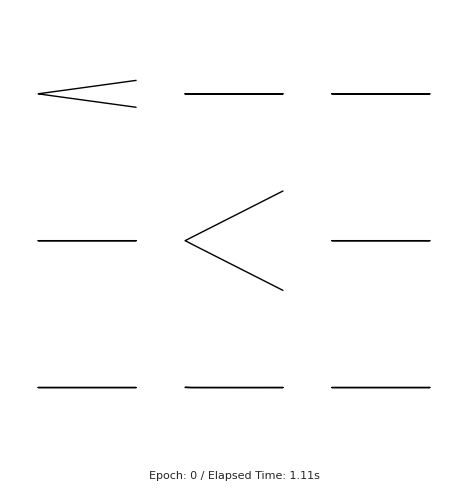

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def generate_and_plot_airfoils(generator, epoch: int = None, num_airfoils=9, scale=0.8, scatter=False, annotate=False, dot_size=20, figsize=(5, 5), linewidth=1.0, time=None):

  def plot_samples(airfoils, scale=0.8, scatter=False, annotate=False, dot_size=20, figsize=(5,5), linewidth=1.0, **kwargs):
      '''
      Plot airfoil coordinates inline.

      Parameters:
      -----------
      airfoils : list of Airfoil objects
          List of Airfoil objects containing the coordinates to be plotted.
      scale : float, optional
          Scaling factor for the plot.
      scatter : bool, optional
          Whether to plot the shapes as a scatter plot.
      annotate : bool, optional
          Whether to annotate the points with their indices.
      dot_size : int, optional
          Size of the dots in the scatter plot.
      figsize : tuple, optional
          Size of the figure (width, height) in inches. Default is (5, 5).
      linewidth : float, optional
          Thickness of the lines when plotting shapes. Default is 1.0.
      **kwargs : dict
          Additional keyword arguments for plotting.
      '''

      # Create a 2D plot with a customizable figure size
      fig, ax = plt.subplots(figsize=figsize)

      # Generate a grid for positioning airfoils
      N = len(airfoils)
      points_per_axis = int(np.sqrt(N))
      bounds = (0., 1.)
      Z = gen_grid(2, points_per_axis, bounds[0], bounds[1])  # Generate a grid

      scale /= points_per_axis

      for (i, z) in enumerate(Z):
          # Extract coordinates from the Airfoil object
          coordinates = airfoils[i].coordinates
          plot_shape(coordinates, z[0], z[1], ax, scale, scatter, dot_size, linewidth, **kwargs)
          if annotate:
              label = '{0}'.format(i+1)
              ax.annotate(label, xy=(z[0], z[1]), size=10)

      plt.xticks([])
      plt.yticks([])
      plt.axis('off')
      plt.axis('equal')
      plt.tight_layout()

      # Add a text box at the bottom to display losses
      if time is not None and epoch is not None:
          loss_text = f"Epoch: {epoch} / Elapsed Time: {time:.2f}s"
          plt.figtext(0.5, 0.01, loss_text, ha="center", fontsize=4)

      plt.savefig('./images/image_at_epoch_{:04d}.png'.format(epoch))
      plt.show()  # Display the plot inline

  def plot_shape(coordinates, x, y, ax, scale, scatter, dot_size, linewidth, **kwargs):
      '''
      Helper function to plot a single shape.

      Parameters:
      -----------
      coordinates : numpy.ndarray
          The coordinates of the shape to be plotted.
      x : float
          The x-coordinate for the shape's position.
      y : float
          The y-coordinate for the shape's position.
      ax : matplotlib.axes.Axes
          The axis to plot on.
      scale : float
          Scaling factor for the plot.
      scatter : bool
          Whether to plot the shapes as a scatter plot.
      dot_size : int
          Size of the dots in the scatter plot.
      linewidth : float
          Thickness of the lines when plotting shapes.
      **kwargs : dict
          Additional keyword arguments for plotting.
      '''
      # Adjust coordinates based on the position (x, y) and scale
      adjusted_coords = coordinates * scale + np.array([x, y])

      if scatter:
          ax.scatter(adjusted_coords[:, 0], adjusted_coords[:, 1], s=dot_size, color='black', **kwargs)
      else:
          ax.plot(adjusted_coords[:, 0], adjusted_coords[:, 1], color='black', linewidth=linewidth, **kwargs)

  def gen_grid(dim, points_per_axis, lower_bound, upper_bound):
      '''
      Generate a grid of points in the specified dimension.

      Parameters:
      -----------
      dim : int
          The dimension of the grid.
      points_per_axis : int
          Number of points per axis.
      lower_bound : float
          Lower bound for the grid.
      upper_bound : float
          Upper bound for the grid.

      Returns:
      --------
      numpy.ndarray
          A grid of points.
      '''
      # Generate a grid of points
      grid = np.mgrid[[slice(lower_bound, upper_bound, points_per_axis*1j) for _ in range(dim)]]
      grid = grid.reshape(dim, -1).T
      return grid

  # Example usage:
  noise = tf.random.normal([num_airfoils, 128])
  generated_coords, _, _ = generator(noise, training=False)

  # Create a list of Airfoil objects with random coordinates
  airfoils = [Airfoil(coordinates=coords) for coords in generated_coords]

  plot_samples(airfoils, scale=1, scatter=False, annotate=False, figsize=(2.5, 2.5), linewidth=0.5)

test_generator = CSTGenerator(128)

generate_and_plot_airfoils(test_generator, time=1.1122, epoch=0, num_airfoils=9, scale=1, scatter=False, annotate=False, figsize=(2.5, 2.5), linewidth=0.5)

In [ ]:
import numpy as np
import tensorflow as tf
from scipy.stats import wasserstein_distance

def calculate_wasserstein_distance(real_data, generator, latent_dim: int = 128):
  # Generate noise and obtain generated airfoil coordinates
  noise = tf.random.normal([real_data.shape[0], latent_dim])
  generated_coords, _, _ = generator(noise, training=False)

  # Extract X and Y coordinates (without flattening)
  real_airfoils_y = real_data[:, :, 1]

  generated_airfoils_y = generated_coords[:, :, 1].numpy()

  # real_airfoils_y = (real_airfoils_y - np.min(real_airfoils_y)) / (np.max(real_airfoils_y) - np.min(real_airfoils_y))
  # generated_airfoils_y = (generated_airfoils_y - np.min(real_airfoils_y)) / (np.max(real_airfoils_y) - np.min(real_airfoils_y))

  # Compute Wasserstein Distance per airfoil and average
  wd_y = np.mean([wasserstein_distance(real_airfoils_y[i], generated_airfoils_y[i]) for i in range(real_airfoils_y.shape[0])])

  print(f"Mean Wasserstein Distance (Y-coordinates): {wd_y}")

  return wd_y

# calculate_wasserstein_distance(real_data_np, test_generator)

In [ ]:
import numpy as np
import tensorflow as tf
from scipy.spatial.distance import cdist

# Define the MMD function using a Gaussian RBF kernel
def mmd_rbf(X, Y, gamma=1.0):
    XX = np.exp(-gamma * cdist(X, X, metric='sqeuclidean'))
    YY = np.exp(-gamma * cdist(Y, Y, metric='sqeuclidean'))
    XY = np.exp(-gamma * cdist(X, Y, metric='sqeuclidean'))
    return np.mean(XX) + np.mean(YY) - 2 * np.mean(XY)

def calculate_mmd(real_data, generator, latent_dim: int = 128):
    # Generate noise and obtain generated airfoil coordinates
    noise = tf.random.normal([real_data.shape[0], latent_dim])
    generated_coords, _, _ = generator(noise, training=False)

    # Extract Y-coordinates for MMD computation
    real_airfoils_y = real_data[:, :, 1]
    generated_airfoils_y = generated_coords[:, :, 1].numpy()

    # Normalize the coordinates (optional, depends on data scale)
    # real_airfoils_y = (real_airfoils_y - np.min(real_airfoils_y)) / (np.max(real_airfoils_y) - np.min(real_airfoils_y))
    # generated_airfoils_y = (generated_airfoils_y - np.min(real_airfoils_y)) / (np.max(real_airfoils_y) - np.min(real_airfoils_y))

    # Compute MMD using RBF kernel
    mmd_y = mmd_rbf(real_airfoils_y, generated_airfoils_y)
    print(f"Mean MMD (Y-coordinates): {mmd_y}")

    return mmd_y

# Example usage:
_ = calculate_mmd(real_data_np, test_generator)

Mean MMD (Y-coordinates): 0.30809724110883074


In [ ]:
# import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Flatten the arrays for 1D histogram plotting
# real_y_flat = real_data[:, :, 1].flatten()
# generated_y_flat = generated_airfoils_y.flatten()

# # Plot the Y-coordinate distributions
# plt.figure(figsize=(12, 5))
# sns.histplot(real_y_flat, bins=50, color="blue", label="Real Y", kde=True, alpha=0.5)
# sns.histplot(generated_y_flat, bins=50, color="red", label="Generated Y", kde=True, alpha=0.5)
# plt.legend()
# plt.title("Y-Coordinate Distribution (Real vs. Generated)")
# plt.show()


NameError: name 'real_airfoils_y' is not defined

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
airfoil_dataset = pd.read_json("/content/drive/MyDrive/TCC/Data/airfoil_dataset.json")
display(airfoil_dataset)

,airfoil_name,coordinates,shape,points
0,2032c,"[[1.0, 0.0016], [0.9995417967, 0.0016995265], ...","[149, 2]",149
1,a18,"[[0.999952181, 0.0030692550000000003], [0.9995...","[149, 2]",149
2,a18sm,"[[1.0000000153, 0.003065], [0.9995529208, 0.00...","[149, 2]",149
3,a63a108c,"[[1.0000122498, 0.0034999571], [0.9995549037, ...","[149, 2]",149
4,ag03,"[[1.0000001216, 0.0006050018], [0.99954566, 0....","[149, 2]",149
...,...,...,...,...
2165,Zone-36,"[[1.0000001524, 0.0003349966], [0.9995453662, ...","[149, 2]",149
2166,Zone-40,"[[1.000000063, 0.0003499965], [0.9995449988, 0...","[149, 2]",149
2167,Zone-46,"[[1.0000000456, 0.0003649963], [0.9995447776, ...","[149, 2]",149
2168,Zone-52,"[[0.9999999372, 0.00040500400000000004], [0.99...","[149, 2]",149


In [ ]:
batch_size = 64

real_data_np = np.stack(airfoil_dataset['coordinates'].values) # Shape: (n_rows, 149, 2)
real_data = tf.convert_to_tensor(real_data_np, dtype=tf.float32)

dataset = tf.data.Dataset.from_tensor_slices(real_data)
dataset = dataset.shuffle(buffer_size=1000, seed=seed).batch(batch_size)

In [ ]:
from tqdm import tqdm
import time
import pickle

@tf.function
def train_step(real_data, gen_train_multiple = 1, disc_train_multiple = 1, add_noise=False):
    batch_size = tf.shape(real_data)[0]

    # Generate random latent vectors
    noise = tf.random.normal([batch_size, 128])

    for _ in range(gen_train_multiple):
      with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        fake_data, _, _ = generator(noise, training=True)

        fake_output = discriminator(fake_data, training=True)

        gen_loss = generator_loss(fake_output)

      gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
      generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

    for _ in range(disc_train_multiple):
      with tf.GradientTape() as disc_tape:
        # Generate fake data (again, since the generator was updated)
        fake_data, _, _ = generator(noise, training=True)

        # Discriminator predictions on real and fake data
        if add_noise:
          # Add noise to discriminator data
          real_data_noisy = real_data + tf.random.normal(tf.shape(real_data), mean=0.0, stddev=0.1)
          fake_data_noisy = fake_data + tf.random.normal(tf.shape(fake_data), mean=0.0, stddev=0.1)
          real_output = discriminator(real_data_noisy, training=True)
          fake_output = discriminator(fake_data_noisy, training=True)
        else:
          real_output = discriminator(real_data, training=True)
          fake_output = discriminator(fake_data, training=True)

        # Discriminator loss
        disc_loss, disc_real_loss, disc_fake_loss = discriminator_loss(real_output, fake_output)

      gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
      discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return disc_loss, disc_real_loss, disc_fake_loss, gen_loss

def train(dataset, epochs, add_noise = False, gen_train_multiple = 1, disc_train_multiple = 1):
  elapsed_time = 0
  disc_losses = []
  gen_losses = []
  wd_list = []
  mmd_list = []

  try:
    # Training loop
    for epoch in range(epochs):
        print(f"\nEpoch {epoch + 1}/{epochs}")
        start_time = time.time()

        # Initialize epoch losses
        epoch_disc_loss = 0.0
        epoch_gen_loss = 0.0
        epoch_real_loss = 0.0
        epoch_fake_loss = 0.0
        epoch_fake_accuracy = 0.0
        num_batches = 0

        with tqdm(dataset, desc="Training", leave=True) as progress_bar:
            for batch in progress_bar:
                disc_loss, disc_real_loss, disc_fake_loss, gen_loss = train_step(batch, gen_train_multiple=gen_train_multiple, disc_train_multiple=disc_train_multiple, add_noise=add_noise)

                epoch_disc_loss += disc_loss.numpy()
                epoch_gen_loss += gen_loss.numpy()
                epoch_real_loss += disc_real_loss.numpy()
                epoch_fake_loss += disc_fake_loss.numpy()
                num_batches += 1

                # Update tqdm description
                progress_bar.set_postfix({"D_loss": f"{disc_loss.numpy():.4f}", "G_loss": f"{gen_loss.numpy():.4f}"})

        # Calculate average losses for the epoch
        avg_disc_loss = epoch_disc_loss / num_batches
        avg_gen_loss = epoch_gen_loss / num_batches
        avg_real_loss = epoch_real_loss / num_batches
        avg_fake_loss = epoch_fake_loss / num_batches

        disc_losses.append(avg_disc_loss)
        gen_losses.append(avg_gen_loss)

        # Print epoch results
        epoch_time = time.time() - start_time
        elapsed_time = elapsed_time + epoch_time
        print(f"\nDiscriminator Loss: {avg_disc_loss:.4f}, Generator Loss: {avg_gen_loss:.4f}, Time: {epoch_time:.2f}s")

        # print("Calculating Wasserstein Distance...")
        # wd = calculate_wasserstein_distance(real_data_np, generator)
        # wd_list.append(wd)

        # mmd = calculate_mmd(real_data_np, generator)
        # mmd_list.append(mmd)

        print("Generating and plotting airfoils...")
        # Produce images for the GIF as you go
        # display.clear_output(wait=True)
        generate_and_plot_airfoils(generator, time=elapsed_time, epoch=epoch + 1, num_airfoils=9, scale=1, scatter=False, annotate=False, figsize=(2.5, 2.5), linewidth=0.5)

        # Save training data
        training_history = {"gen_losses": gen_losses, "disc_losses": disc_losses, "wd": wd_list, "mmd": mmd_list}

        with open('training_history.pkl', 'wb') as f:
            pickle.dump(training_history, f)

        # Save model checkpoints every 5 epochs
        if (epoch + 1) % 5 == 0:
            print("Saving model checkpoints...")
            # Save the generator
            generator.save(f"./models/generator_model_{epoch+1}.keras")

            # Save the discriminator
            discriminator.save(f"./models/discriminator_model_{epoch+1}.keras")

  except KeyboardInterrupt:
    print("\nTraining interrupted. Saving progress...")
    generator.save(f"./models/generator_model_interrupted.keras")
    discriminator.save(f"./models/discriminator_model_interrupted.keras")

  finally:
      print("\nPlotting losses before exiting...")
      plot_losses(disc_losses, gen_losses)
      return disc_losses, gen_losses, wd_list, mmd_list


def plot_losses(disc_losses, gen_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(disc_losses, label="Discriminator Loss", color='red')
    plt.plot(gen_losses, label="Generator Loss", color='blue')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Discriminator and Generator Loss Over Training")
    plt.legend()
    plt.grid()
    plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



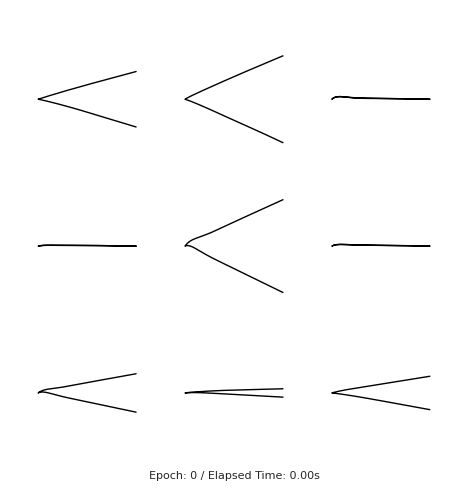


Epoch 1/5000


Training: 100%|██████████| 34/34 [00:40<00:00,  1.20s/it, D_loss=1.3523, G_loss=0.8126]


Discriminator Loss: 1.3714, Generator Loss: 0.7610, Time: 40.95s
Generating and plotting airfoils...


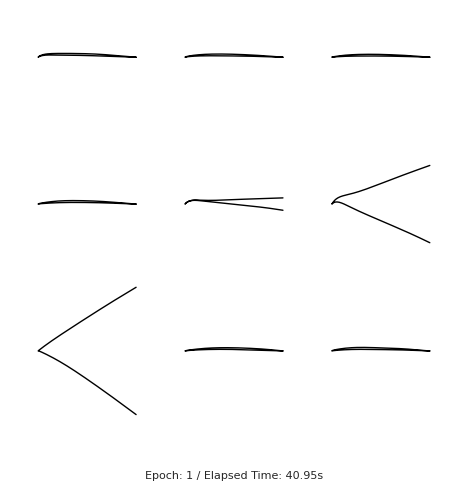


Epoch 2/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.1895, G_loss=0.9313]



Discriminator Loss: 1.2777, Generator Loss: 0.8888, Time: 5.11s
Generating and plotting airfoils...


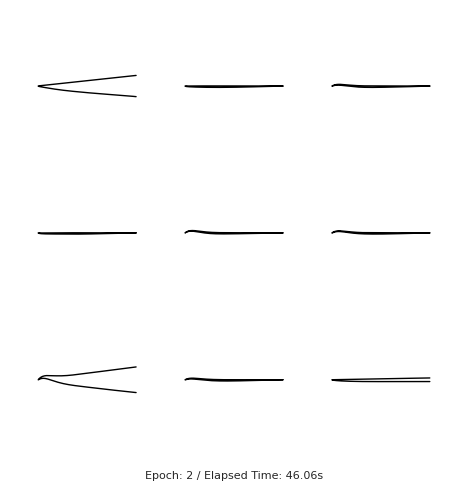


Epoch 3/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2677, G_loss=1.2254]


Discriminator Loss: 1.2746, Generator Loss: 0.9773, Time: 5.11s
Generating and plotting airfoils...


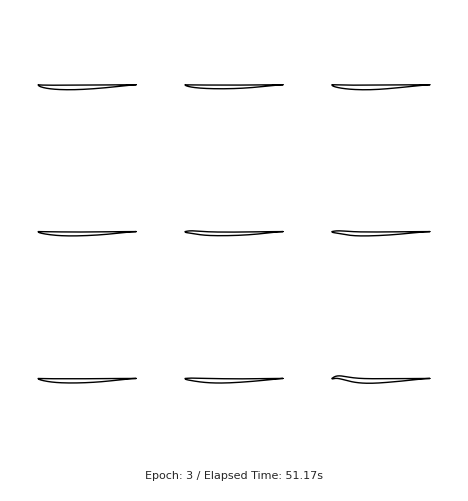


Epoch 4/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3578, G_loss=0.9650]


Discriminator Loss: 1.3002, Generator Loss: 1.0016, Time: 5.11s
Generating and plotting airfoils...


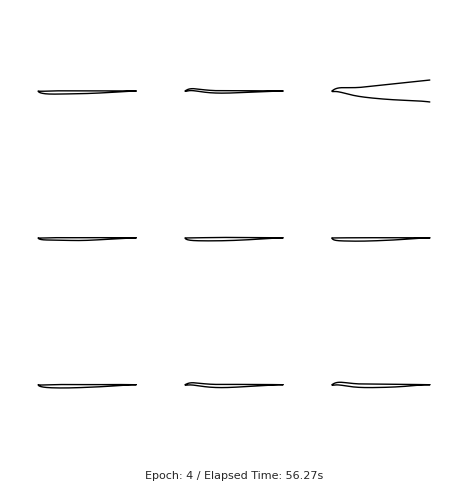


Epoch 5/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3522, G_loss=0.8459]


Discriminator Loss: 1.3338, Generator Loss: 0.9212, Time: 5.10s
Generating and plotting airfoils...


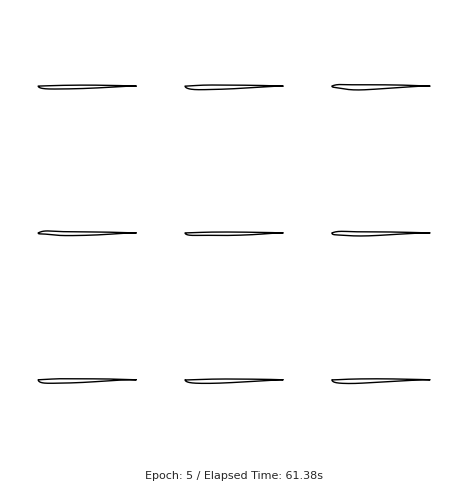

Saving model checkpoints...

Epoch 6/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3073, G_loss=0.8418]


Discriminator Loss: 1.3403, Generator Loss: 0.8791, Time: 5.11s
Generating and plotting airfoils...


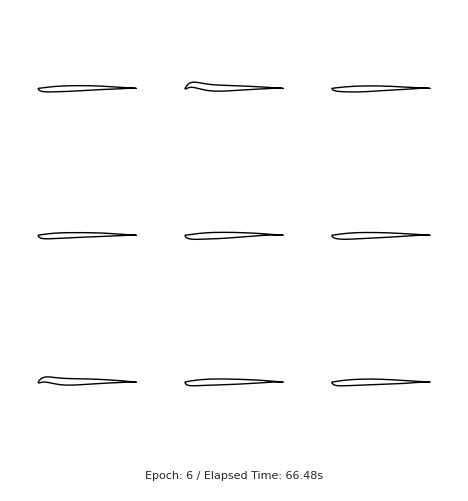


Epoch 7/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3864, G_loss=0.8269]


Discriminator Loss: 1.3528, Generator Loss: 0.8553, Time: 5.10s
Generating and plotting airfoils...


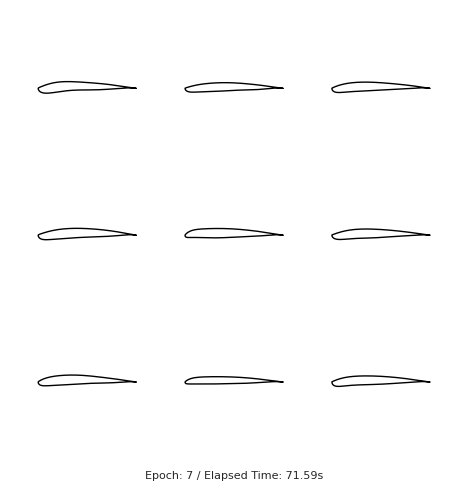


Epoch 8/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3835, G_loss=0.8251]


Discriminator Loss: 1.3825, Generator Loss: 0.8349, Time: 5.11s
Generating and plotting airfoils...


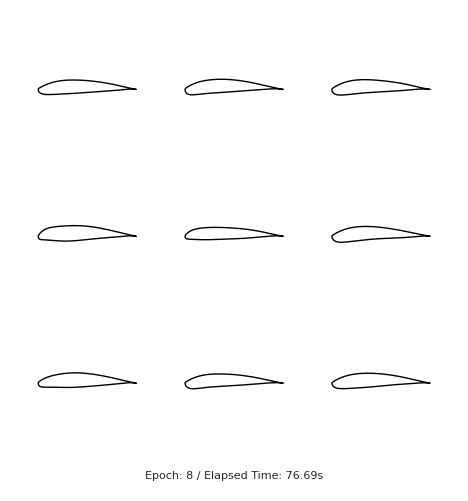


Epoch 9/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3594, G_loss=0.8703]



Discriminator Loss: 1.3671, Generator Loss: 0.8467, Time: 5.11s
Generating and plotting airfoils...


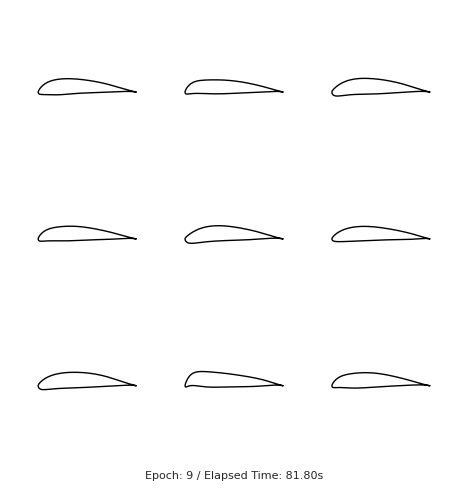


Epoch 10/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3659, G_loss=0.8940]


Discriminator Loss: 1.3442, Generator Loss: 0.8842, Time: 5.11s
Generating and plotting airfoils...


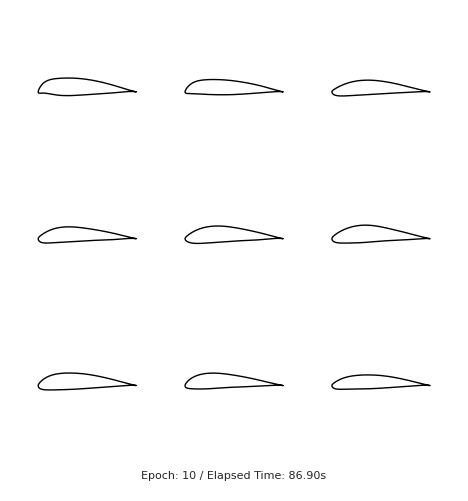

Saving model checkpoints...

Epoch 11/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3328, G_loss=0.9035]



Discriminator Loss: 1.3495, Generator Loss: 0.9055, Time: 5.11s
Generating and plotting airfoils...


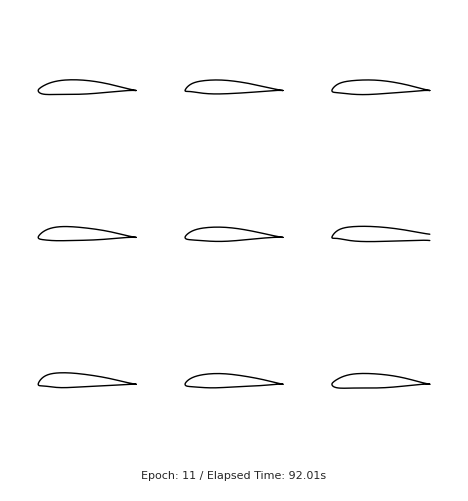


Epoch 12/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3492, G_loss=0.9173]


Discriminator Loss: 1.3465, Generator Loss: 0.9313, Time: 5.11s
Generating and plotting airfoils...


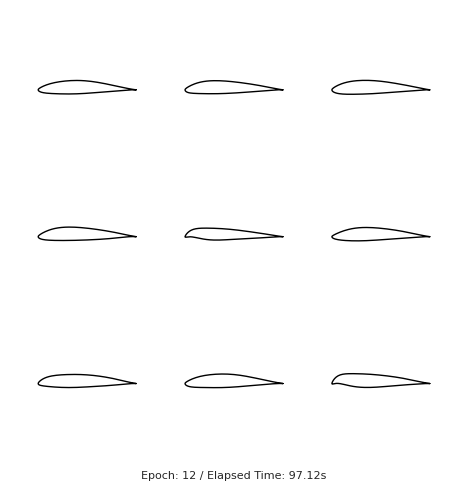


Epoch 13/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3437, G_loss=0.9747]


Discriminator Loss: 1.3358, Generator Loss: 0.9688, Time: 5.11s
Generating and plotting airfoils...


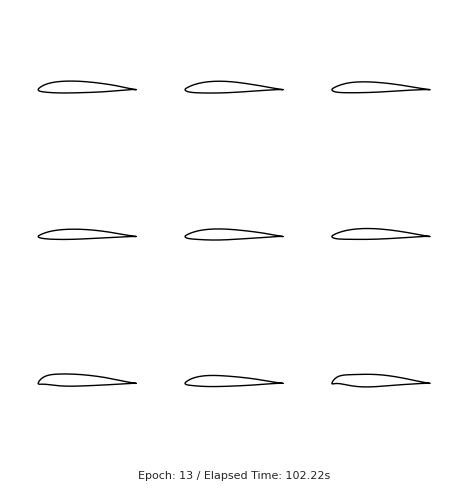


Epoch 14/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3128, G_loss=1.0022]


Discriminator Loss: 1.3304, Generator Loss: 1.0333, Time: 5.11s
Generating and plotting airfoils...


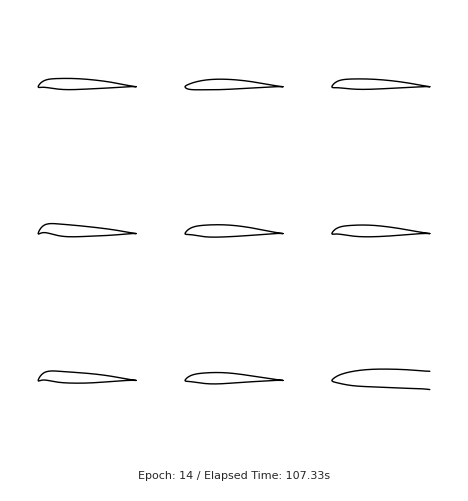


Epoch 15/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3094, G_loss=1.0390]


Discriminator Loss: 1.3279, Generator Loss: 1.0476, Time: 5.11s
Generating and plotting airfoils...


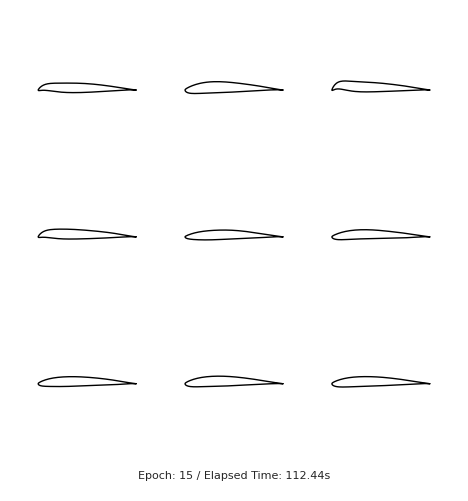

Saving model checkpoints...

Epoch 16/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3467, G_loss=1.1025]


Discriminator Loss: 1.3221, Generator Loss: 1.0801, Time: 5.11s
Generating and plotting airfoils...


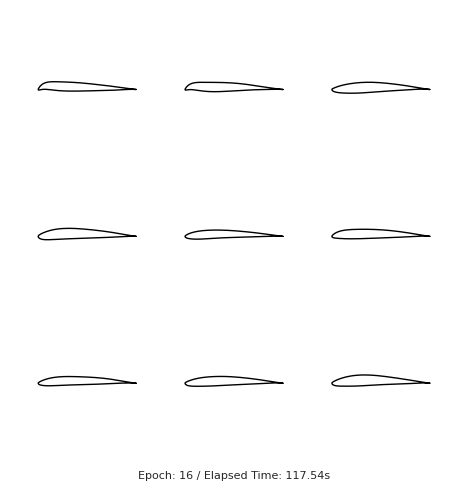


Epoch 17/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.3513, G_loss=1.1127]


Discriminator Loss: 1.3174, Generator Loss: 1.0991, Time: 5.11s
Generating and plotting airfoils...


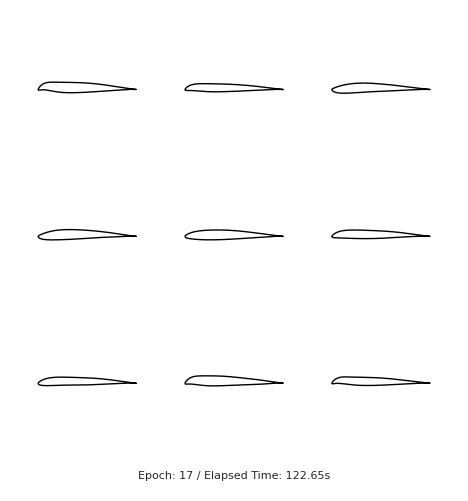


Epoch 18/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2850, G_loss=1.2367]



Discriminator Loss: 1.2979, Generator Loss: 1.1243, Time: 5.11s
Generating and plotting airfoils...


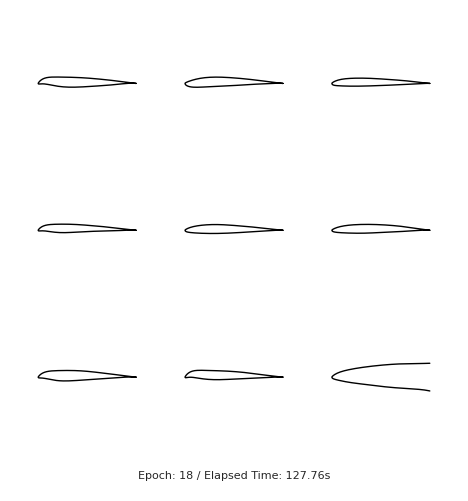


Epoch 19/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 11.90it/s, D_loss=1.2743, G_loss=1.1087]



Discriminator Loss: 1.2938, Generator Loss: 1.1083, Time: 2.86s
Generating and plotting airfoils...


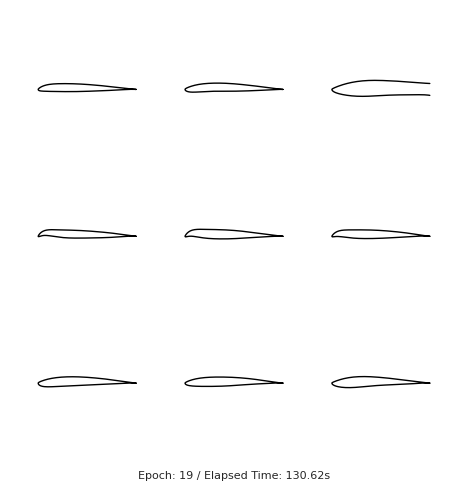


Epoch 20/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 13.09it/s, D_loss=1.2478, G_loss=1.2153]



Discriminator Loss: 1.2784, Generator Loss: 1.1433, Time: 2.60s
Generating and plotting airfoils...


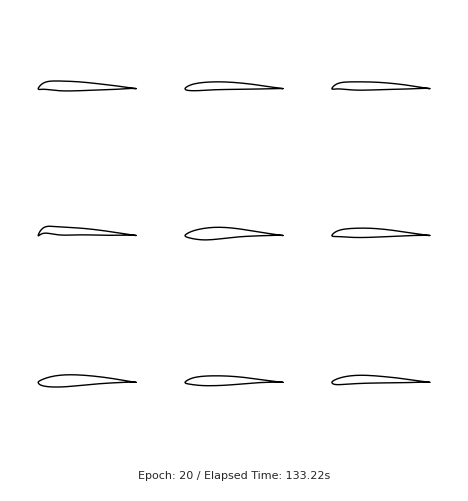

Saving model checkpoints...

Epoch 21/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2745, G_loss=1.1099]


Discriminator Loss: 1.2696, Generator Loss: 1.1710, Time: 5.11s
Generating and plotting airfoils...


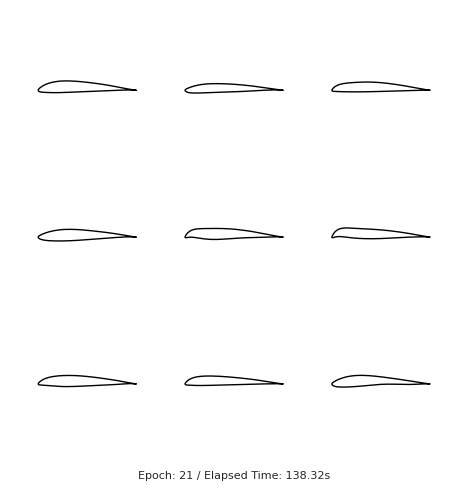


Epoch 22/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2806, G_loss=1.1727]


Discriminator Loss: 1.2585, Generator Loss: 1.1605, Time: 5.11s
Generating and plotting airfoils...


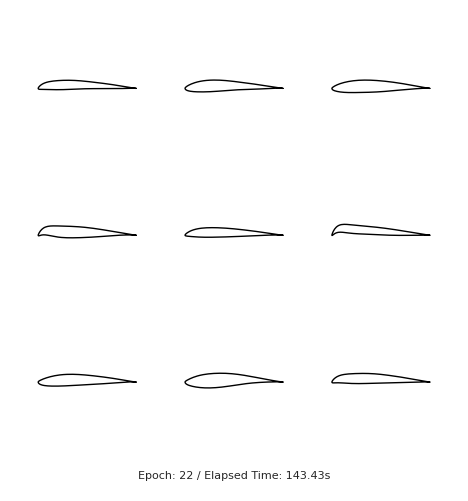


Epoch 23/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 12.32it/s, D_loss=1.3222, G_loss=1.1375]



Discriminator Loss: 1.2698, Generator Loss: 1.1875, Time: 2.76s
Generating and plotting airfoils...


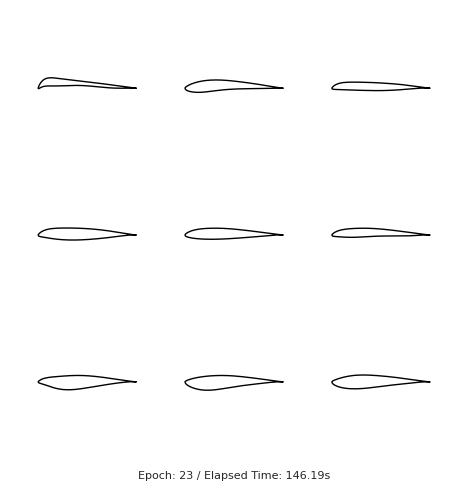


Epoch 24/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2501, G_loss=1.0680]


Discriminator Loss: 1.2718, Generator Loss: 1.1236, Time: 5.11s
Generating and plotting airfoils...


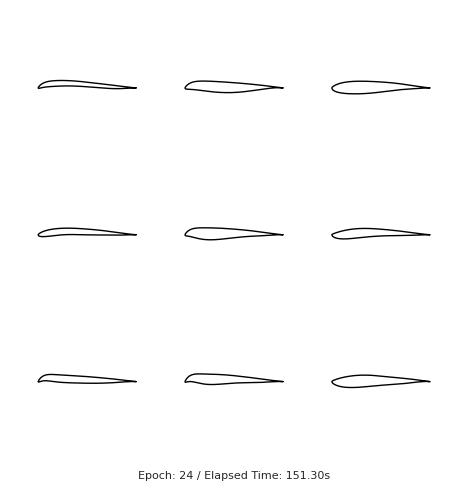


Epoch 25/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 11.42it/s, D_loss=1.3002, G_loss=1.0288]



Discriminator Loss: 1.2762, Generator Loss: 1.1504, Time: 2.98s
Generating and plotting airfoils...


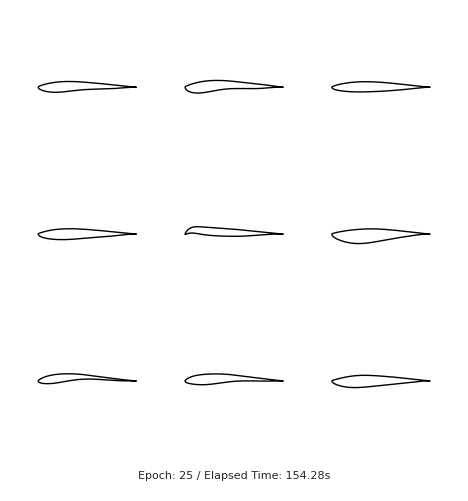

Saving model checkpoints...

Epoch 26/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2394, G_loss=1.0816]


Discriminator Loss: 1.2680, Generator Loss: 1.1290, Time: 5.11s
Generating and plotting airfoils...


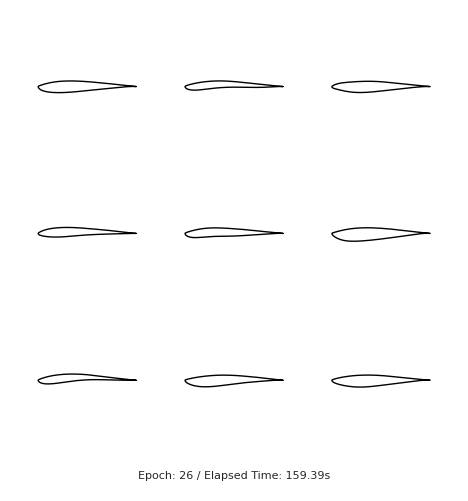


Epoch 27/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2526, G_loss=1.1007]



Discriminator Loss: 1.2627, Generator Loss: 1.1106, Time: 5.10s
Generating and plotting airfoils...


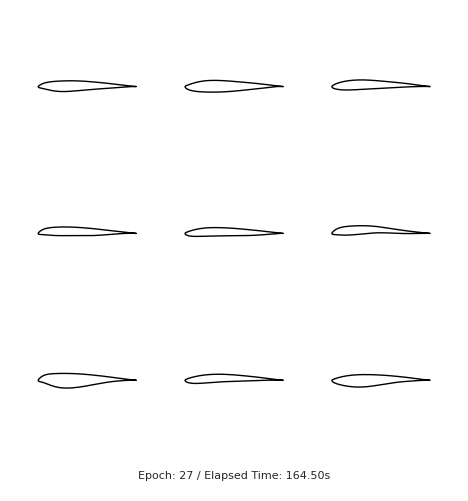


Epoch 28/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 11.79it/s, D_loss=1.2371, G_loss=1.1178]



Discriminator Loss: 1.2600, Generator Loss: 1.1004, Time: 2.89s
Generating and plotting airfoils...


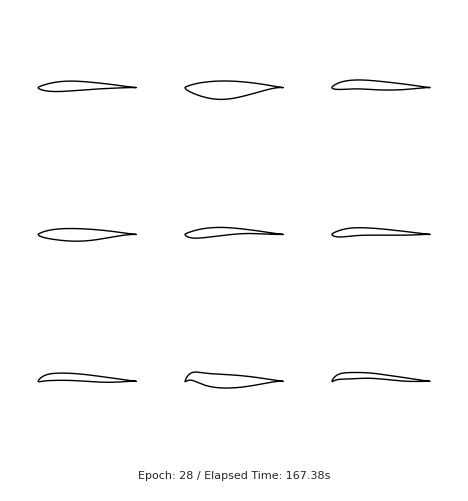


Epoch 29/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2048, G_loss=1.0010]


Discriminator Loss: 1.2401, Generator Loss: 1.0786, Time: 5.11s
Generating and plotting airfoils...


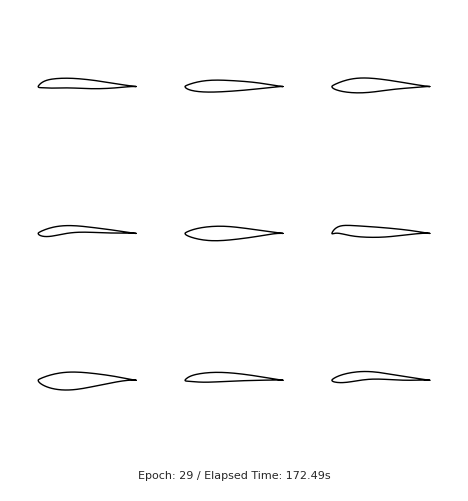


Epoch 30/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2456, G_loss=1.0342]



Discriminator Loss: 1.2528, Generator Loss: 1.1000, Time: 5.11s
Generating and plotting airfoils...


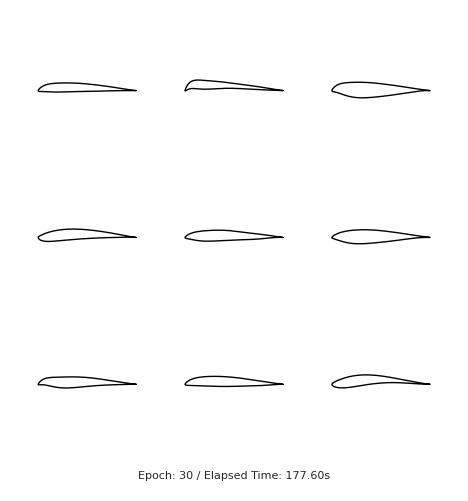

Saving model checkpoints...

Epoch 31/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2800, G_loss=1.0711]


Discriminator Loss: 1.2385, Generator Loss: 1.1202, Time: 5.11s
Generating and plotting airfoils...


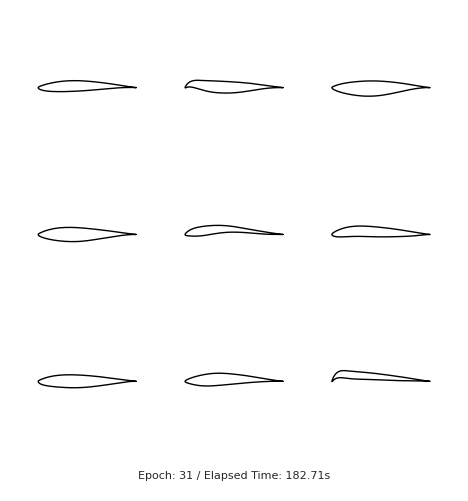


Epoch 32/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.2716, G_loss=1.3032]



Discriminator Loss: 1.2551, Generator Loss: 1.1593, Time: 5.11s
Generating and plotting airfoils...


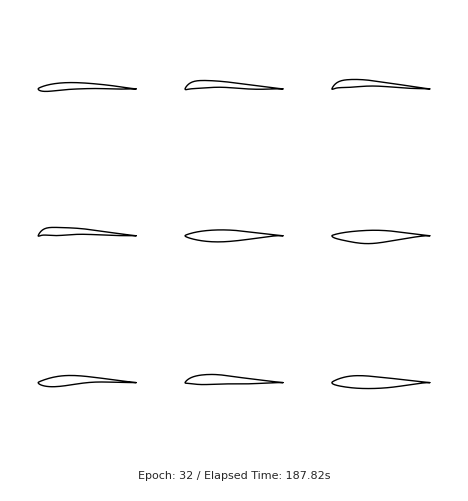


Epoch 33/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 11.58it/s, D_loss=1.2665, G_loss=1.1170]



Discriminator Loss: 1.2487, Generator Loss: 1.1478, Time: 2.94s
Generating and plotting airfoils...


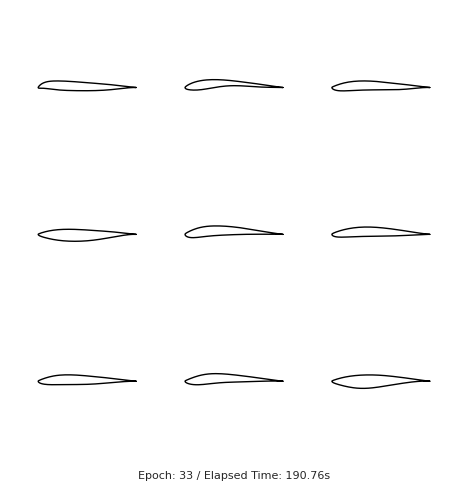


Epoch 34/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 13.03it/s, D_loss=1.1756, G_loss=1.1064]



Discriminator Loss: 1.2465, Generator Loss: 1.1422, Time: 2.61s
Generating and plotting airfoils...


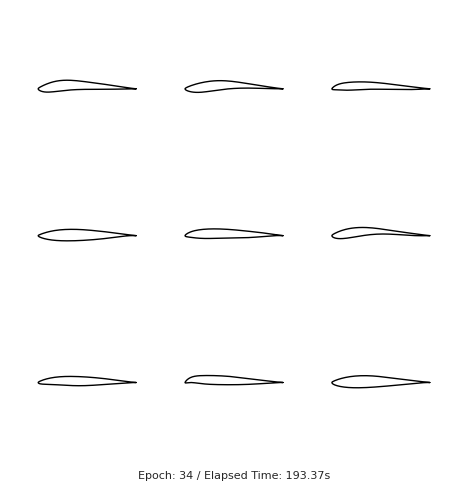


Epoch 35/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 12.91it/s, D_loss=1.1998, G_loss=1.1329]



Discriminator Loss: 1.2430, Generator Loss: 1.1374, Time: 2.64s
Generating and plotting airfoils...


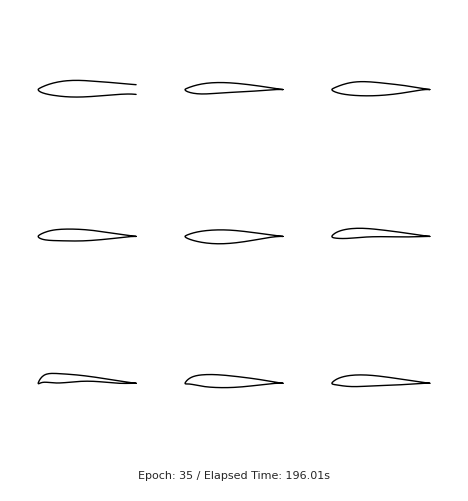

Saving model checkpoints...

Epoch 36/5000


Training: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s, D_loss=1.1093, G_loss=1.1148]



Discriminator Loss: 1.2357, Generator Loss: 1.1347, Time: 5.11s
Generating and plotting airfoils...


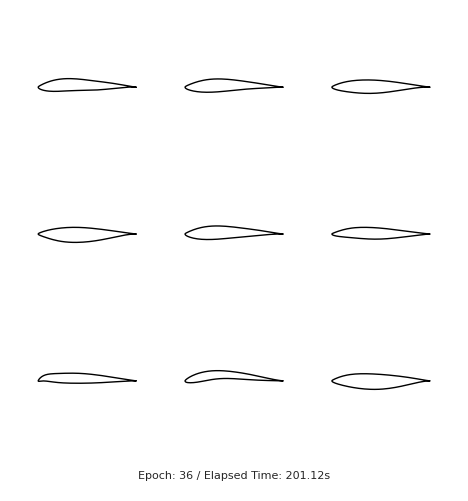


Epoch 37/5000


Training: 100%|██████████| 34/34 [00:02<00:00, 12.10it/s, D_loss=1.2141, G_loss=1.2502]



Discriminator Loss: 1.2396, Generator Loss: 1.1832, Time: 2.81s
Generating and plotting airfoils...


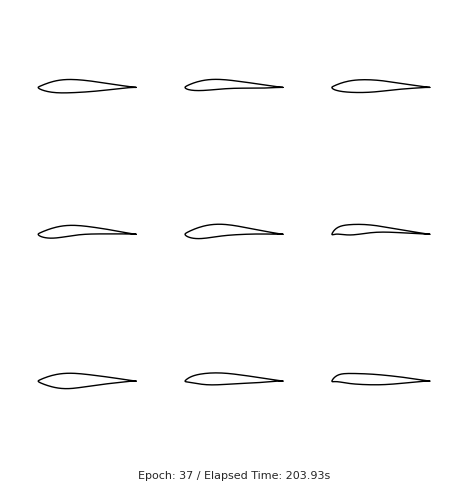


Epoch 38/5000


Training:  97%|█████████▋| 33/34 [00:02<00:00, 12.40it/s, D_loss=1.1700, G_loss=1.1121]



Training interrupted. Saving progress...

Plotting losses before exiting...


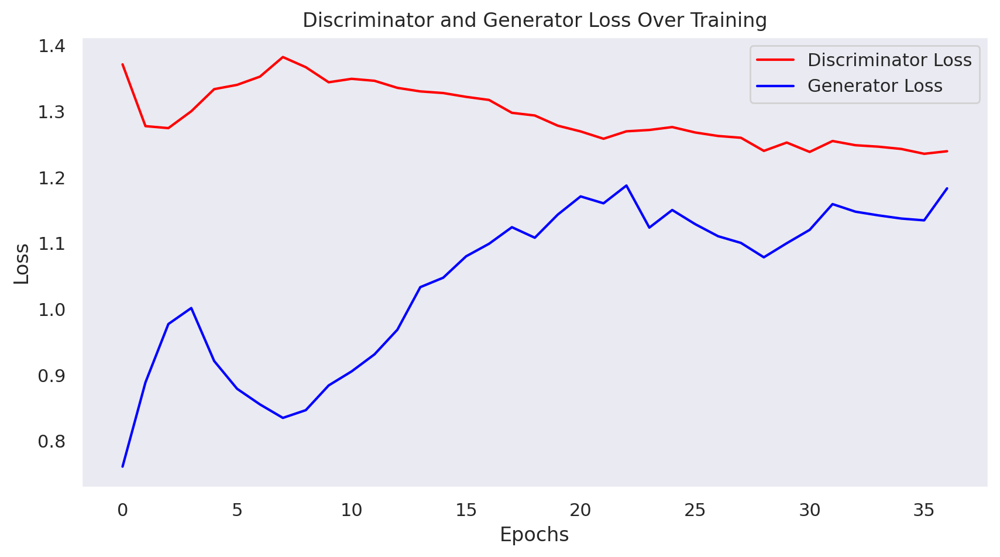

In [ ]:
generator = CSTGenerator(latent_dim = 128, depth=256, n_points_per_side=75)
discriminator = CSTDiscriminator(depth=8, dense_units=256, n_points_per_side=75)

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1= 0.5)

generate_and_plot_airfoils(generator, time=0, epoch=0, num_airfoils=9, scale=1, scatter=False, annotate=False, figsize=(2.5, 2.5), linewidth=0.5)

EPOCHS = 5000

disc_losses, gen_losses, wd_list, mmd_list = train(dataset, EPOCHS, add_noise = True, disc_train_multiple=3)

In [ ]:
with open('training_history.pkl', 'rb') as f:
    training_history = pickle.load(f)

df = pd.DataFrame({
    'Index': list(range(len(training_history["mmd"]))),
    'MMD': training_history["mmd"],
    'WD': training_history["wd"]
})

# Plot the data using Plotly Express
fig = px.line(df, x='Index', y='MMD')
fig.show()

In [ ]:
import math

def sigmoid(x):
  return 1 / (1 + math.exp(-x))

noise = tf.random.normal([1, 128])
generated_coords, _, _ = generator(noise, training=False)
print(f"D prediction on generated airfoil: {sigmoid(discriminator(generated_coords))}")
print(f"D prediction on real airfoil: {sigmoid(discriminator(Airfoil('NACA0012').repanel(75).coordinates))}")
print()
# test = Airfoil(coordinates=generated_coords[0])
# test.draw()

NameError: name 'generator' is not defined

In [ ]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

import imageio
import glob

anim_file = 'plainGAN_149_points.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('./images/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-z9w0cyby
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-z9w0cyby
  Resolved https://github.com/tensorflow/docs to commit 18c3a45517af27c8513e165b8a52e6bbc1204b99
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2025.3.6.10029-py3-none-any.whl size=186351 sha256=022faa1a1e609820e006a312bb25b69535aba0eb1ccbba51556beddec90903b5
  Stored in directory: /tmp/pip-ephem-wheel-cache-nh2rvaok/wheels/34/53/89/3db54cf97ce0f0261aaab3fdc12a847ea0879d34edf373e2c5
Successfully built tensorflow-docs


<ipython-input-15-bc58af98de7a>:14: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-15-bc58af98de7a>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



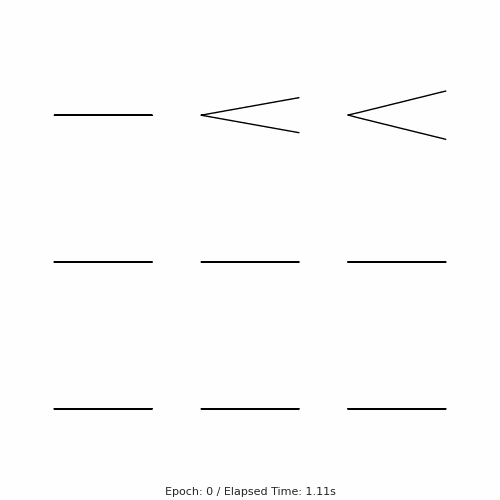

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [ ]:
!zip -r /content/models.zip /content/models

  adding: content/models/ (stored 0%)
  adding: content/models/generator_model_15.keras (deflated 11%)
  adding: content/models/generator_model_1360.keras (deflated 10%)
  adding: content/models/discriminator_model_1435.keras (deflated 8%)
  adding: content/models/discriminator_model_105.keras (deflated 9%)
  adding: content/models/generator_model_510.keras (deflated 10%)
  adding: content/models/generator_model_1535.keras (deflated 10%)
  adding: content/models/generator_model_860.keras (deflated 10%)
  adding: content/models/discriminator_model_1175.keras (deflated 8%)
  adding: content/models/generator_model_1630.keras (deflated 10%)
  adding: content/models/generator_model_1675.keras (deflated 10%)
  adding: content/models/generator_model_540.keras (deflated 10%)
  adding: content/models/discriminator_model_385.keras (deflated 9%)
  adding: content/models/generator_model_50.keras (deflated 11%)
  adding: content/models/discriminator_model_1225.keras (deflated 8%)
  adding: content/